<a href="https://colab.research.google.com/github/Shubhi-2211/FableNest/blob/main/financial_dataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Import Libraries

In [1]:
import warnings
warnings.simplefilter("ignore")

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import pyplot
import seaborn as sns
import plotly.express as px
import pylab
import scipy.stats as stats


%matplotlib inline

# Load Datset



In [3]:
bank_ls_train = pd.read_csv("credit_train.csv")
bank_ls_test = pd.read_csv("credit_test.csv")

# Data informations:

In [4]:
bank_ls_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100514 entries, 0 to 100513
Data columns (total 19 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   Loan ID                       100000 non-null  object 
 1   Customer ID                   100000 non-null  object 
 2   Loan Status                   100000 non-null  object 
 3   Current Loan Amount           100000 non-null  float64
 4   Term                          100000 non-null  object 
 5   Credit Score                  80846 non-null   float64
 6   Annual Income                 80846 non-null   float64
 7   Years in current job          95778 non-null   object 
 8   Home Ownership                100000 non-null  object 
 9   Purpose                       100000 non-null  object 
 10  Monthly Debt                  100000 non-null  float64
 11  Years of Credit History       100000 non-null  float64
 12  Months since last delinquent  46859 non-null

In [5]:
bank_ls_train.describe()

,Current Loan Amount,Credit Score,Annual Income,Monthly Debt,Years of Credit History,Months since last delinquent,Number of Open Accounts,Number of Credit Problems,Current Credit Balance,Maximum Open Credit,Bankruptcies,Tax Liens
count,1.000000e+05,80846.000000,8.084600e+04,100000.000000,100000.000000,46859.000000,100000.00000,100000.000000,1.000000e+05,9.999800e+04,99796.000000,99990.000000
mean,1.176045e+07,1076.456089,1.378277e+06,18472.412336,18.199141,34.901321,11.12853,0.168310,2.946374e+05,7.607984e+05,0.117740,0.029313
std,3.178394e+07,1475.403791,1.081360e+06,12174.992609,7.015324,21.997829,5.00987,0.482705,3.761709e+05,8.384503e+06,0.351424,0.258182
min,1.080200e+04,585.000000,7.662700e+04,0.000000,3.600000,0.000000,0.00000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000
25%,1.796520e+05,705.000000,8.488440e+05,10214.162500,13.500000,16.000000,8.00000,0.000000,1.126700e+05,2.734380e+05,0.000000,0.000000
50%,3.122460e+05,724.000000,1.174162e+06,16220.300000,16.900000,32.000000,10.00000,0.000000,2.098170e+05,4.678740e+05,0.000000,0.000000
75%,5.249420e+05,741.000000,1.650663e+06,24012.057500,21.700000,51.000000,14.00000,0.000000,3.679588e+05,7.829580e+05,0.000000,0.000000
max,1.000000e+08,7510.000000,1.655574e+08,435843.280000,70.500000,176.000000,76.00000,15.000000,3.287897e+07,1.539738e+09,7.000000,15.000000


# EDA

In [6]:
bank_ls_train.columns

Index(['Loan ID', 'Customer ID', 'Loan Status', 'Current Loan Amount', 'Term',
       'Credit Score', 'Annual Income', 'Years in current job',
       'Home Ownership', 'Purpose', 'Monthly Debt', 'Years of Credit History',
       'Months since last delinquent', 'Number of Open Accounts',
       'Number of Credit Problems', 'Current Credit Balance',
       'Maximum Open Credit', 'Bankruptcies', 'Tax Liens'],
      dtype='object')

In [7]:
bank_ls_test.columns

Index(['Loan ID', 'Customer ID', 'Current Loan Amount', 'Term', 'Credit Score',
       'Annual Income', 'Years in current job', 'Home Ownership', 'Purpose',
       'Monthly Debt', 'Years of Credit History',
       'Months since last delinquent', 'Number of Open Accounts',
       'Number of Credit Problems', 'Current Credit Balance',
       'Maximum Open Credit', 'Bankruptcies', 'Tax Liens'],
      dtype='object')

Data shape:

In [8]:
print("Number of rows : ", bank_ls_train.shape[0])
print("Number of columns : ", bank_ls_train.shape[1])

Number of rows :  100514
Number of columns :  19


In [9]:
print("Number of rows : ", bank_ls_test.shape[0])
print("Number of columns : ", bank_ls_test.shape[1])

Number of rows :  10353
Number of columns :  18


Null values:

In [10]:
bank_ls_train.isnull().sum()

,0
Loan ID,514
Customer ID,514
Loan Status,514
Current Loan Amount,514
Term,514
Credit Score,19668
Annual Income,19668
Years in current job,4736
Home Ownership,514
Purpose,514


In [11]:
bank_ls_test.isnull().sum()

,0
Loan ID,353
Customer ID,353
Current Loan Amount,353
Term,353
Credit Score,2334
Annual Income,2334
Years in current job,780
Home Ownership,353
Purpose,353
Monthly Debt,353


Check and Drop duplicates

**Reminder : The shape of bank_ls_train data is (100514, 19)**

In [12]:
bank_ls_train.duplicated().sum()

10728

In [13]:
bank_ls_train.drop_duplicates(inplace = True)
bank_ls_train.shape

(89786, 19)

**Reminder : The shape of bank_ls_test data is (10353, 18)**

In [14]:
bank_ls_test.duplicated().sum()

352

In [15]:
bank_ls_test.drop_duplicates(inplace = True)
bank_ls_test.shape

(10001, 18)

In [16]:
bank_ls_train.isnull().sum()

,0
Loan ID,1
Customer ID,1
Loan Status,1
Current Loan Amount,1
Term,1
Credit Score,19155
Annual Income,19155
Years in current job,3803
Home Ownership,1
Purpose,1


In [17]:
bank_ls_test.isnull().sum()

,0
Loan ID,1
Customer ID,1
Current Loan Amount,1
Term,1
Credit Score,1982
Annual Income,1982
Years in current job,428
Home Ownership,1
Purpose,1
Monthly Debt,1


<Axes: >

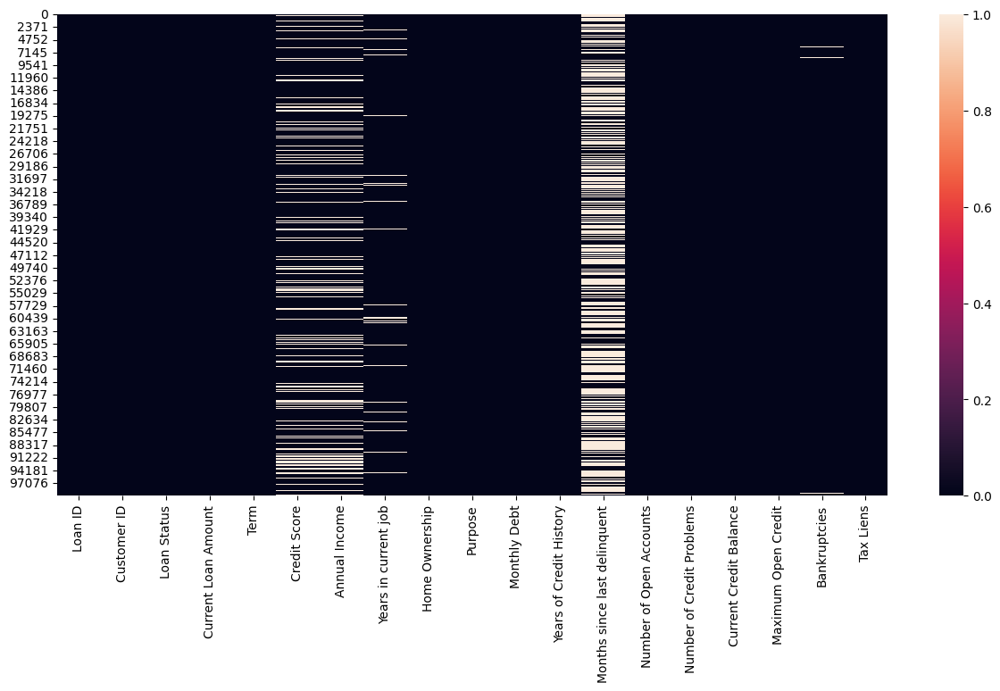

In [18]:
plt.figure(figsize = (15,7))
sns.heatmap(bank_ls_train.isnull())

<Axes: >

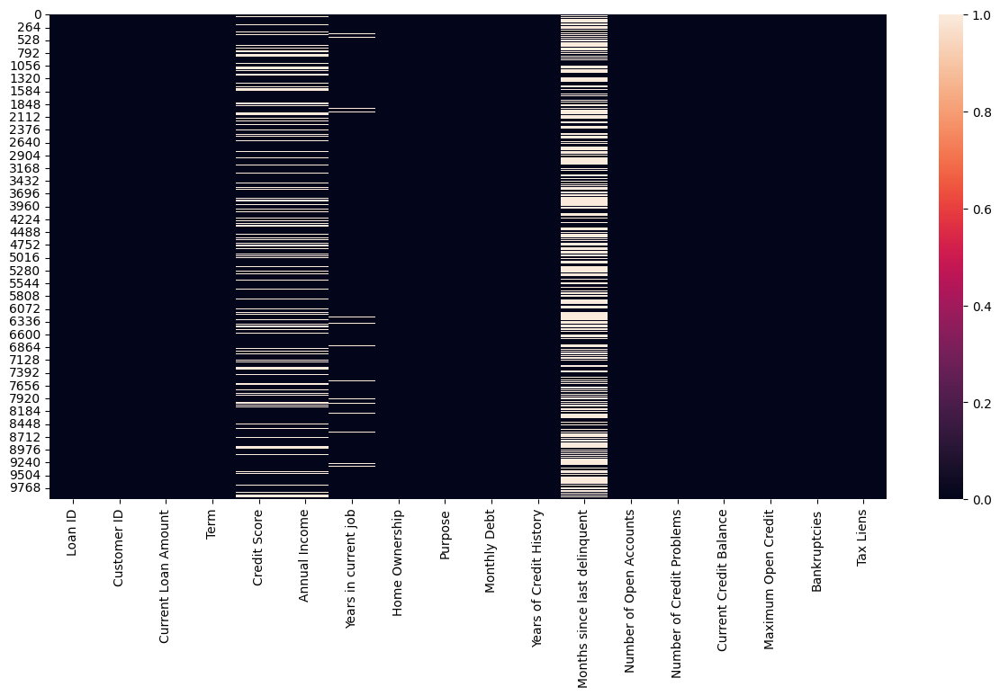

In [19]:
plt.figure(figsize = (15,7))
sns.heatmap(bank_ls_test.isnull())

# Visualization of Categorical Columns

In [20]:
for col in bank_ls_train.select_dtypes(include=["object"]):
    print(col)

Loan ID
Customer ID
Loan Status
Term
Years in current job
Home Ownership
Purpose


<Axes: ylabel='count'>

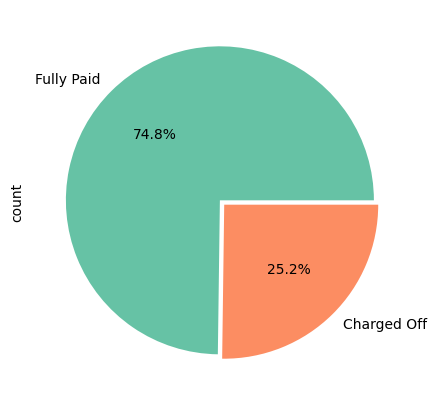

In [21]:
round(bank_ls_train["Loan Status"].value_counts()/ bank_ls_train.shape[0]*100,2).plot.pie(autopct = '%1.1f%%',figsize =(5,5),explode=(0.02,0.02),colors=sns.color_palette("Set2"))

<Axes: xlabel='Term', ylabel='count'>

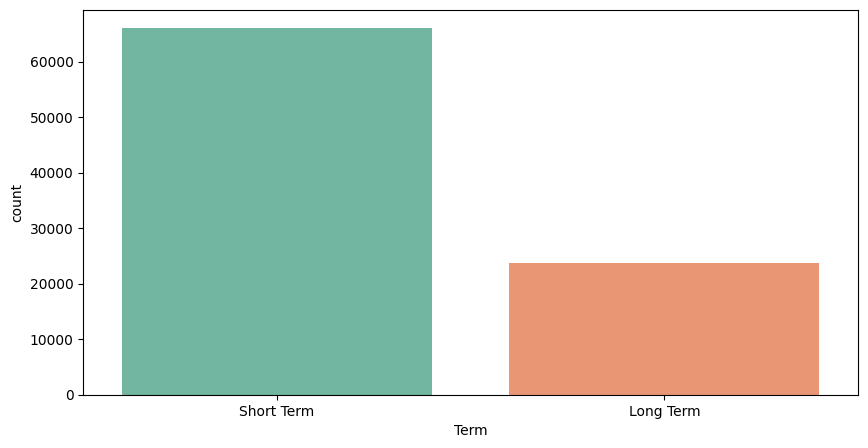

In [22]:
plt.figure(figsize = (10,5))
sns.countplot(x= bank_ls_train["Term"], palette="Set2")

<Axes: xlabel='Years in current job', ylabel='count'>

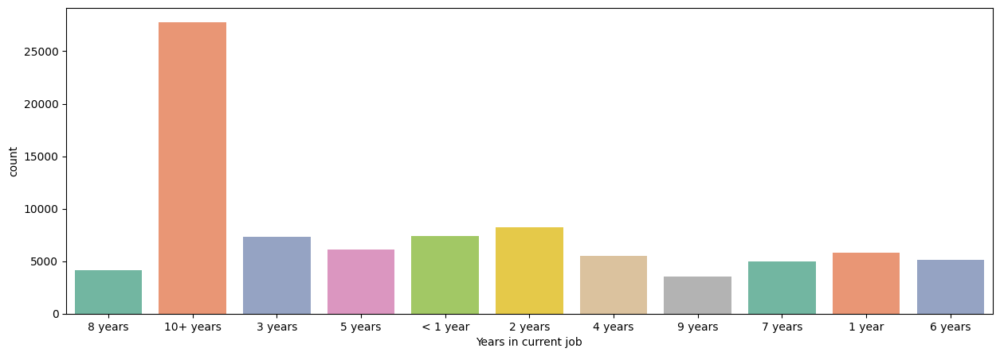

In [23]:
plt.figure(figsize = (15,5))
sns.countplot(x= bank_ls_train["Years in current job"], palette="Set2")

<Axes: xlabel='Home Ownership', ylabel='count'>

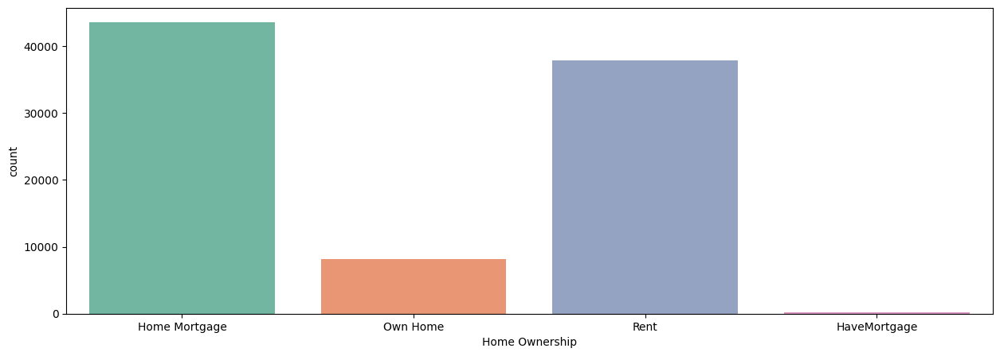

In [24]:
plt.figure(figsize = (15,5))
sns.countplot(x= bank_ls_train["Home Ownership"], palette="Set2")

As we can Observe that according to this data and its distributions, that People taken loans, have residence in such patter or distribution that reduces from :- Home Mortgage > Rent > Own Home > Have Mortgage

<Axes: xlabel='count', ylabel='Purpose'>

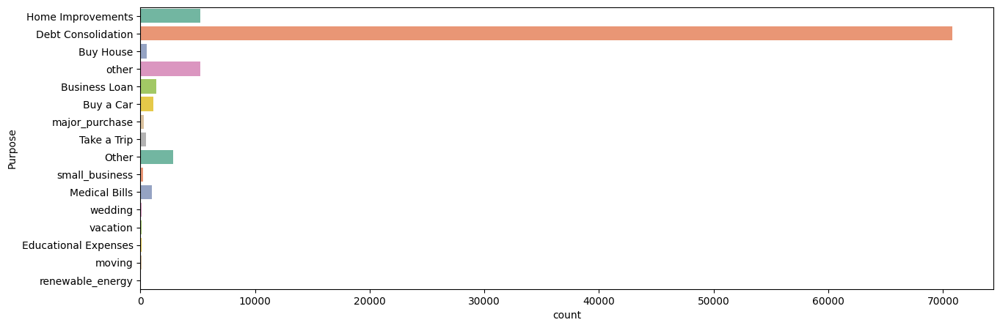

In [25]:
plt.figure(figsize = (15,5))
sns.countplot(y= bank_ls_train["Purpose"], palette="Set2")

Most of the people have given "Home Consolidation" as the Purpose to take Loans from the bank

In [26]:
for col in bank_ls_test.select_dtypes(include=["object"]):
    print(col)

Loan ID
Customer ID
Term
Years in current job
Home Ownership
Purpose


<Axes: xlabel='Term', ylabel='count'>

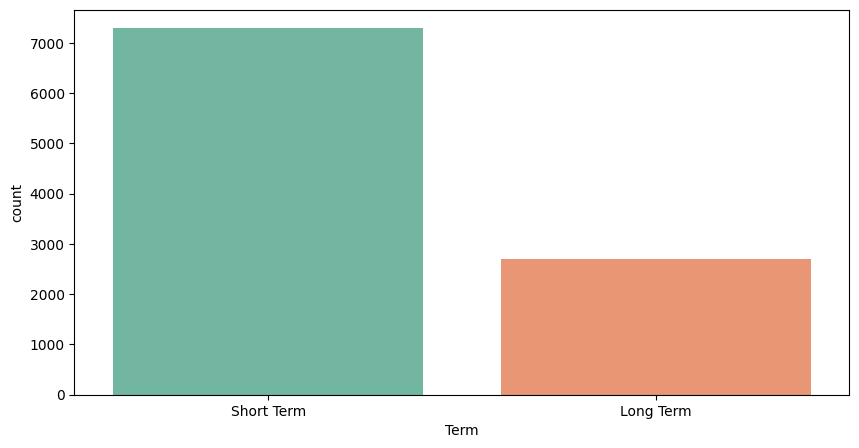

In [34]:
plt.figure(figsize = (10,5))
sns.countplot(x= bank_ls_test["Term"], palette="Set2")

<Axes: xlabel='Years in current job', ylabel='count'>

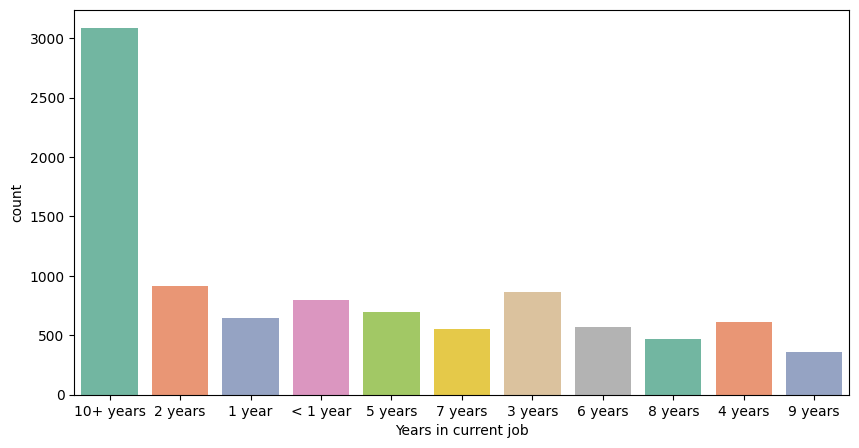

In [36]:
plt.figure(figsize = (10,5))
sns.countplot(x= bank_ls_test["Years in current job"], palette="Set2")

<Axes: xlabel='Home Ownership', ylabel='count'>

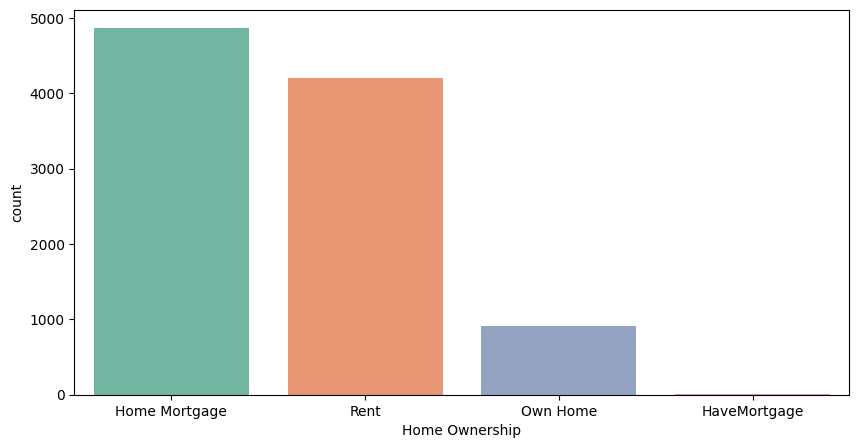

In [38]:
plt.figure(figsize = (10,5))
sns.countplot(x= bank_ls_test["Home Ownership"], palette="Set2")

As we can Observe that according to this data and its distributions, that People taken loans, have residence in such patter or distribution that reduces from :- Home Mortgage > Rent > Own Home > Have Mortgage

<Axes: xlabel='count', ylabel='Purpose'>

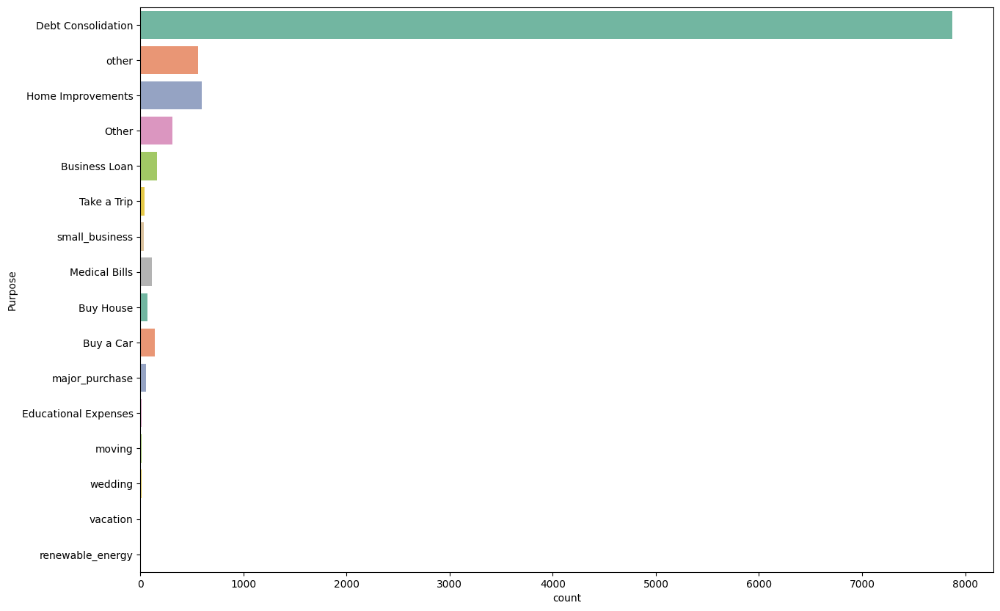

In [39]:
plt.figure(figsize = (15,10))
sns.countplot(y= bank_ls_test["Purpose"], palette="Set2")

Most of the people have given "Home Consolidation" as the Purpose to take Loans from the bank

# Visualization of Numerical Columns

In [40]:
for col in bank_ls_train.select_dtypes(include=["number"]):
    print(col)

Current Loan Amount
Credit Score
Annual Income
Monthly Debt
Years of Credit History
Months since last delinquent
Number of Open Accounts
Number of Credit Problems
Current Credit Balance
Maximum Open Credit
Bankruptcies
Tax Liens


In [41]:
fig = px.histogram(bank_ls_train, x="Current Loan Amount", marginal="box", color = "Loan Status")
fig.show()

In [42]:
fig = px.histogram(bank_ls_train, x="Credit Score", marginal="box", color = "Loan Status")
fig.show()

In [43]:
fig = px.histogram(bank_ls_train, x="Annual Income", marginal="box", color = "Loan Status")
fig.show()

In [44]:
fig = px.histogram(bank_ls_train, x="Monthly Debt", marginal="box", color = "Loan Status")
fig.show()

In [45]:
fig = px.histogram(bank_ls_train, x="Years of Credit History", marginal="box", color = "Loan Status")
fig.show()

In [46]:
fig = px.histogram(bank_ls_train, x="Months since last delinquent", marginal="box", color = "Loan Status")
fig.show()

In [47]:
fig = px.histogram(bank_ls_train, x = "Number of Open Accounts", marginal="box", color = "Loan Status")
fig.show()

In [48]:
fig = px.histogram(bank_ls_train, x="Number of Credit Problems", marginal="box", color = "Loan Status")
fig.show()

In [49]:
fig = px.histogram(bank_ls_train, x="Current Credit Balance", marginal="box", color = "Loan Status")
fig.show()

In [50]:
fig = px.histogram(bank_ls_train, x="Maximum Open Credit", marginal="box", color = "Loan Status")
fig.show()

In [51]:
fig = px.histogram(bank_ls_train, x="Bankruptcies", marginal="box", color = "Loan Status")
fig.show()

In [52]:
fig = px.histogram(bank_ls_train, x="Tax Liens", marginal="box", color = "Loan Status")
fig.show()

# Preprocessing

In [53]:
bank_ls_train.isnull().sum()

,0
Loan ID,1
Customer ID,1
Loan Status,1
Current Loan Amount,1
Term,1
Credit Score,19155
Annual Income,19155
Years in current job,3803
Home Ownership,1
Purpose,1


In [54]:
bank_ls_test.isnull().sum()

,0
Loan ID,1
Customer ID,1
Current Loan Amount,1
Term,1
Credit Score,1982
Annual Income,1982
Years in current job,428
Home Ownership,1
Purpose,1
Monthly Debt,1


# Drop Loan ID and Customer ID From Test and Train Data

In [55]:
bank_ls_train.drop(columns = ["Loan ID","Customer ID"], inplace=True)
bank_ls_test.drop(columns = ["Loan ID","Customer ID"], inplace=True)

Drop Months since last delinquent column 'nearly 50% of the values are nulls'

In [56]:
bank_ls_train.drop(columns = ["Months since last delinquent"], inplace = True)
bank_ls_test.drop(columns= ["Months since last delinquent"], inplace = True)

# Deal With Null Values

In [57]:
bank_ls_train.dropna(thresh = 13, inplace = True)
bank_ls_train.isnull().sum()

,0
Loan Status,0
Current Loan Amount,0
Term,0
Credit Score,19150
Annual Income,19150
Years in current job,3802
Home Ownership,0
Purpose,0
Monthly Debt,0
Years of Credit History,0


In [58]:
bank_ls_train.shape

(89781, 16)

In [59]:
bank_ls_test.dropna(thresh = 13, inplace = True)
bank_ls_test.isnull().sum()

,0
Current Loan Amount,0
Term,0
Credit Score,1893
Annual Income,1893
Years in current job,342
Home Ownership,0
Purpose,0
Monthly Debt,0
Years of Credit History,0
Number of Open Accounts,0


In [60]:
bank_ls_test.shape

(9912, 15)

Fill Nulls in 'Years in current job' column and Encode it

In [61]:
mapping_dict = {
    "Years in current job": {
        "10+ years": 10,
        "9 years": 9,
        "8 years": 8,
        "7 years": 7,
        "6 years": 6,
        "5 years": 5,
        "4 years": 4,
        "3 years": 3,
        "2 years": 2,
        "1 year": 1,
        "< 1 year": 0
    }
}
bank_ls_train=bank_ls_train.replace(mapping_dict)
bank_ls_train['Years in current job']=bank_ls_train['Years in current job']
bank_ls_train['Years in current job'].head()

,Years in current job
0,8.0
1,10.0
2,8.0
3,3.0
4,5.0


In [62]:
mapping_dict = {
    "Years in current job": {
        "10+ years": 10,
        "9 years": 9,
        "8 years": 8,
        "7 years": 7,
        "6 years": 6,
        "5 years": 5,
        "4 years": 4,
        "3 years": 3,
        "2 years": 2,
        "1 year": 1,
        "< 1 year": 0
    }
}
bank_ls_test=bank_ls_test.replace(mapping_dict)
bank_ls_test['Years in current job']=bank_ls_test['Years in current job']
bank_ls_test['Years in current job'].head()

,Years in current job
0,10.0
1,10.0
2,2.0
3,10.0
4,10.0


In [63]:
bank_ls_train['Years in current job'].fillna(method='ffill',inplace = True)
bank_ls_test['Years in current job'].fillna(method='bfill', inplace = True)

In [64]:
print(bank_ls_train.isnull().sum())
print("-----------------------------")
print(bank_ls_test.isnull().sum())

Loan Status                      0
Current Loan Amount              0
Term                             0
Credit Score                 19150
Annual Income                19150
Years in current job             0
Home Ownership                   0
Purpose                          0
Monthly Debt                     0
Years of Credit History          0
Number of Open Accounts          0
Number of Credit Problems        0
Current Credit Balance           0
Maximum Open Credit              2
Bankruptcies                   186
Tax Liens                        5
dtype: int64
-----------------------------
Current Loan Amount             0
Term                            0
Credit Score                 1893
Annual Income                1893
Years in current job            0
Home Ownership                  0
Purpose                         0
Monthly Debt                    0
Years of Credit History         0
Number of Open Accounts         0
Number of Credit Problems       0
Current Credit Balance 

Fill Nulls with mean in Bankruptcies and Tax Liens

In [66]:
bank_ls_train['Bankruptcies'].fillna(bank_ls_train['Bankruptcies'].mean(),inplace = True)
bank_ls_test['Bankruptcies'].fillna(bank_ls_test['Bankruptcies'].mean(), inplace = True)
bank_ls_train['Tax Liens'].fillna(bank_ls_train['Tax Liens'].mean(),inplace = True)
bank_ls_test['Tax Liens'].fillna(bank_ls_test['Tax Liens'].mean(), inplace = True)

In [68]:
print(bank_ls_train.isnull().sum())
print("-----------------------------")
print(bank_ls_test.isnull().sum())

Loan Status                      0
Current Loan Amount              0
Term                             0
Credit Score                 19150
Annual Income                19150
Years in current job             0
Home Ownership                   0
Purpose                          0
Monthly Debt                     0
Years of Credit History          0
Number of Open Accounts          0
Number of Credit Problems        0
Current Credit Balance           0
Maximum Open Credit              2
Bankruptcies                     0
Tax Liens                        0
dtype: int64
-----------------------------
Current Loan Amount             0
Term                            0
Credit Score                 1893
Annual Income                1893
Years in current job            0
Home Ownership                  0
Purpose                         0
Monthly Debt                    0
Years of Credit History         0
Number of Open Accounts         0
Number of Credit Problems       0
Current Credit Balance 

Fill Nulls In Credit Score

<Axes: xlabel='Credit Score', ylabel='Density'>

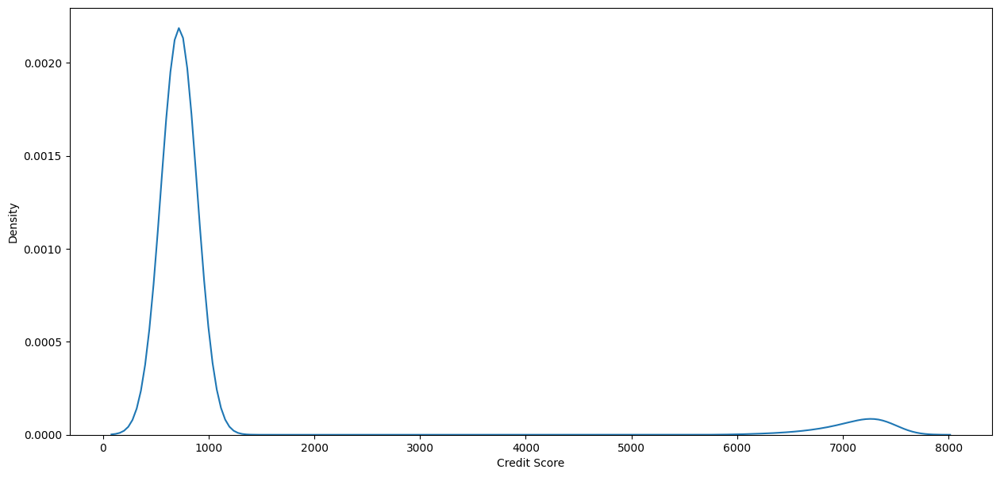

In [69]:
plt.figure(figsize = (15,7))
sns.kdeplot(x = bank_ls_train["Credit Score"])

In [70]:
bank_ls_train['Credit Score'].fillna(bank_ls_train['Credit Score'].median(),inplace = True)
bank_ls_test['Credit Score'].fillna(bank_ls_test['Credit Score'].median(), inplace = True)

<Axes: xlabel='Credit Score', ylabel='Density'>

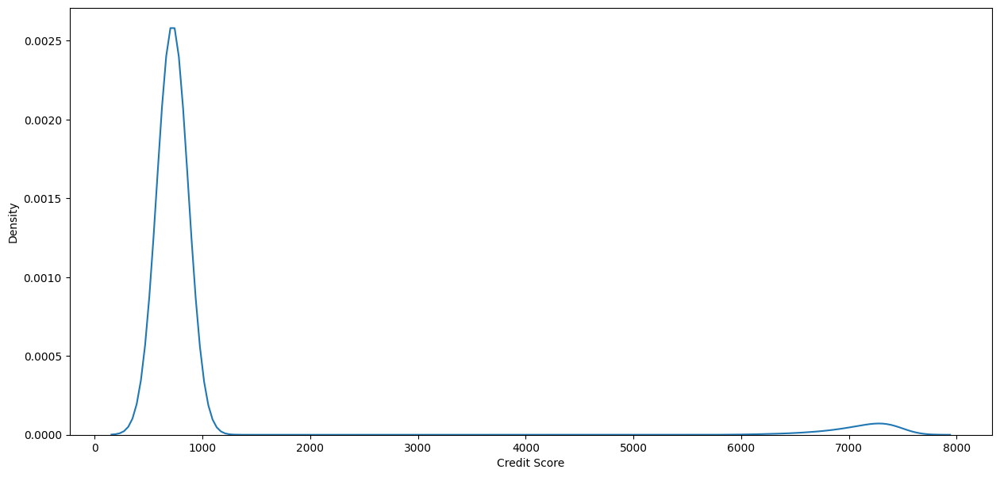

In [71]:
plt.figure(figsize = (15,7))
sns.kdeplot(x = bank_ls_train["Credit Score"])

In [72]:
print(bank_ls_train.isnull().sum())
print("---------------------------------")
print(bank_ls_test.isnull().sum())

Loan Status                      0
Current Loan Amount              0
Term                             0
Credit Score                     0
Annual Income                19150
Years in current job             0
Home Ownership                   0
Purpose                          0
Monthly Debt                     0
Years of Credit History          0
Number of Open Accounts          0
Number of Credit Problems        0
Current Credit Balance           0
Maximum Open Credit              2
Bankruptcies                     0
Tax Liens                        0
dtype: int64
---------------------------------
Current Loan Amount             0
Term                            0
Credit Score                    0
Annual Income                1893
Years in current job            0
Home Ownership                  0
Purpose                         0
Monthly Debt                    0
Years of Credit History         0
Number of Open Accounts         0
Number of Credit Problems       0
Current Credit Bala

Fill Nulls In Annual Income

<Axes: xlabel='Annual Income', ylabel='Density'>

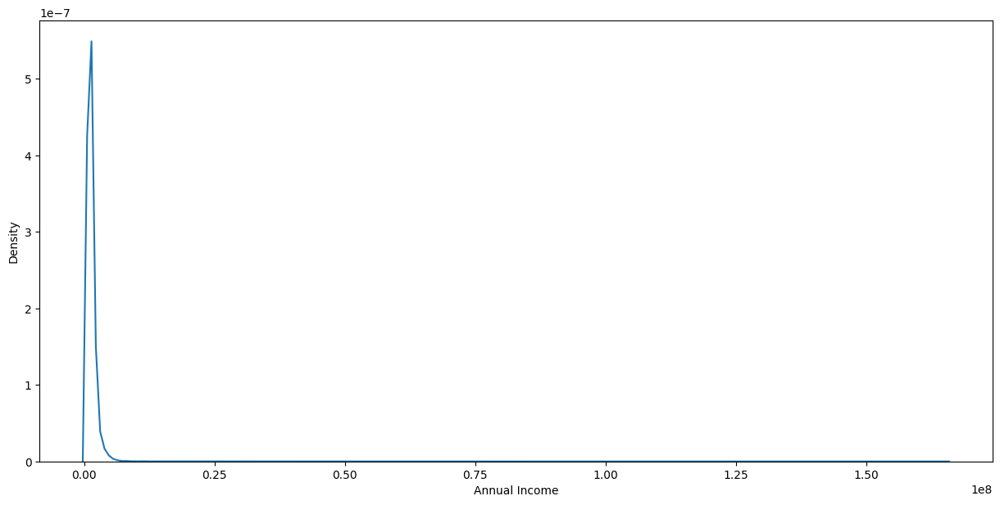

In [73]:
plt.figure(figsize = (15,7))
sns.kdeplot(x = bank_ls_train["Annual Income"])

In [74]:
bank_ls_train['Annual Income'].fillna(bank_ls_train['Annual Income'].mean(),inplace = True)
bank_ls_test['Annual Income'].fillna(bank_ls_test['Annual Income'].mean(), inplace = True)

<Axes: xlabel='Annual Income', ylabel='Density'>

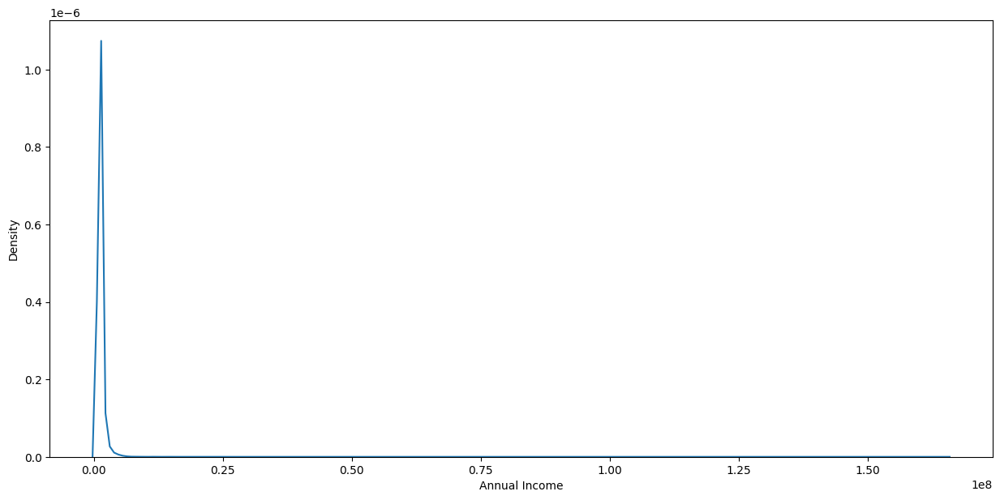

In [75]:
plt.figure(figsize = (15,7))
sns.kdeplot(x = bank_ls_train["Annual Income"])

In [76]:
print(bank_ls_train.isnull().sum())
print("---------------------------------")
print(bank_ls_test.isnull().sum())


Loan Status                  0
Current Loan Amount          0
Term                         0
Credit Score                 0
Annual Income                0
Years in current job         0
Home Ownership               0
Purpose                      0
Monthly Debt                 0
Years of Credit History      0
Number of Open Accounts      0
Number of Credit Problems    0
Current Credit Balance       0
Maximum Open Credit          2
Bankruptcies                 0
Tax Liens                    0
dtype: int64
---------------------------------
Current Loan Amount          0
Term                         0
Credit Score                 0
Annual Income                0
Years in current job         0
Home Ownership               0
Purpose                      0
Monthly Debt                 0
Years of Credit History      0
Number of Open Accounts      0
Number of Credit Problems    0
Current Credit Balance       0
Maximum Open Credit          0
Bankruptcies                 0
Tax Liens              

In [77]:
bank_ls_train["Maximum Open Credit"].fillna(bank_ls_train["Maximum Open Credit"].mean(), inplace= True)

# Encode Categorical columns

In [78]:
for col in bank_ls_train.select_dtypes(include=["object"]):
    print(col)


Loan Status
Term
Home Ownership
Purpose


In [79]:
for col in bank_ls_test.select_dtypes(include=["object"]):
    print(col)

Term
Home Ownership
Purpose


Encoding

In [80]:
from sklearn.preprocessing import LabelEncoder
cols = ["Term","Home Ownership","Purpose"]
for i in cols:
    en = LabelEncoder()
    bank_ls_train[i] = en.fit_transform(bank_ls_train[i])
    bank_ls_test[i] = en.fit_transform(bank_ls_test[i])

In [81]:
en = LabelEncoder()
bank_ls_train["Loan Status"] = en.fit_transform(bank_ls_train["Loan Status"])

In [82]:
bank_ls_train.head()

,Loan Status,Current Loan Amount,Term,Credit Score,Annual Income,Years in current job,Home Ownership,Purpose,Monthly Debt,Years of Credit History,Number of Open Accounts,Number of Credit Problems,Current Credit Balance,Maximum Open Credit,Bankruptcies,Tax Liens
0,1,445412.0,1,709.0,1.167493e+06,8.0,1,5,5214.74,17.2,6.0,1.0,228190.0,416746.0,1.0,0.0
1,1,262328.0,1,729.0,1.375894e+06,10.0,1,3,33295.98,21.1,35.0,0.0,229976.0,850784.0,0.0,0.0
2,1,99999999.0,1,741.0,2.231892e+06,8.0,2,3,29200.53,14.9,18.0,1.0,297996.0,750090.0,0.0,0.0
3,1,347666.0,0,721.0,8.069490e+05,3.0,2,3,8741.90,12.0,9.0,0.0,256329.0,386958.0,0.0,0.0
4,1,176220.0,1,729.0,1.375894e+06,5.0,3,3,20639.70,6.1,15.0,0.0,253460.0,427174.0,0.0,0.0


In [83]:
bank_ls_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 89781 entries, 0 to 99999
Data columns (total 16 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Loan Status                89781 non-null  int64  
 1   Current Loan Amount        89781 non-null  float64
 2   Term                       89781 non-null  int64  
 3   Credit Score               89781 non-null  float64
 4   Annual Income              89781 non-null  float64
 5   Years in current job       89781 non-null  float64
 6   Home Ownership             89781 non-null  int64  
 7   Purpose                    89781 non-null  int64  
 8   Monthly Debt               89781 non-null  float64
 9   Years of Credit History    89781 non-null  float64
 10  Number of Open Accounts    89781 non-null  float64
 11  Number of Credit Problems  89781 non-null  float64
 12  Current Credit Balance     89781 non-null  float64
 13  Maximum Open Credit        89781 non-null  float64


# Remove The Outliers

In [84]:
df_train = bank_ls_train[(np.abs(stats.zscore(bank_ls_train)) < 3).all(axis=1)]
df_test = bank_ls_test[(np.abs(stats.zscore(bank_ls_test)) < 3).all(axis=1)]

Correlation

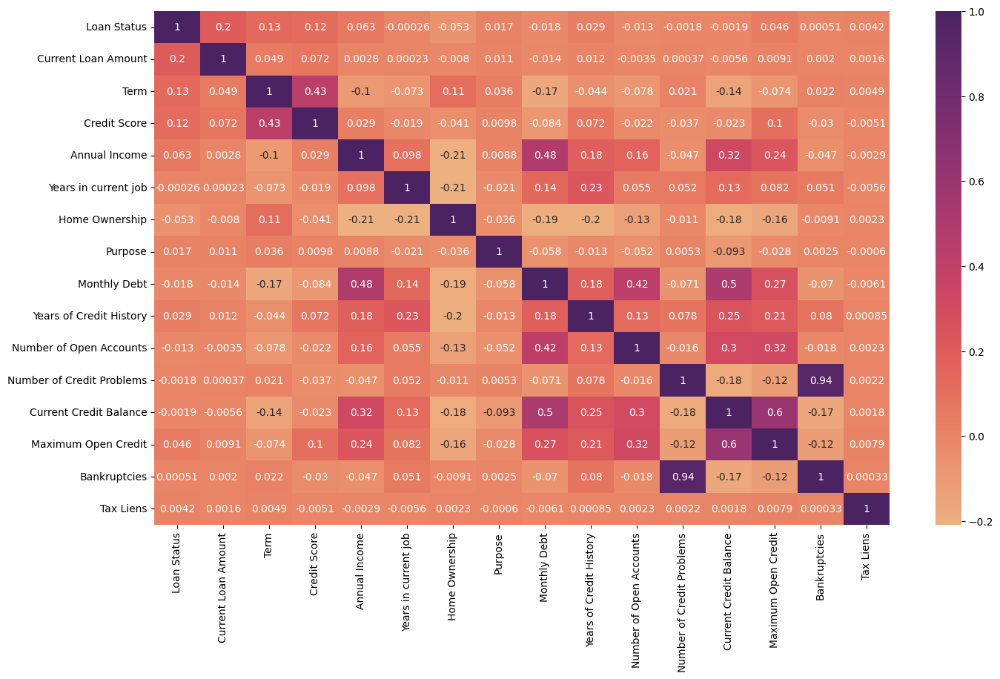

In [85]:
plt.figure(figsize=(16,9))
sns.heatmap(df_train.corr(),annot= True,cmap = 'flare')
plt.show()

In [86]:
x_train = df_train.drop(['Loan Status'] , axis = 1).values
y_train = df_train['Loan Status'].values

In [87]:
x_test = df_test[:]

Data Scaling using Standard Scalar

In [89]:
from sklearn.preprocessing import StandardScaler
ro_scaler = StandardScaler()
x_train = ro_scaler.fit_transform(x_train)
x_test = ro_scaler.fit_transform(x_test)
x_train.shape

(73829, 15)

# Logistic Regression Model

In [90]:
from sklearn.linear_model import LogisticRegression

lr = LogisticRegression()

lr.fit(x_train , y_train)

LogisticRegression()

In [91]:
lr.score(x_train , y_train)

0.7902585704804345

In [92]:
y_pred = lr.predict(x_test)
y_pred

array([1, 1, 1, ..., 1, 1, 1])

# KNN Model

In [93]:
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier(n_neighbors=40)

knn.fit(x_train , y_train )

KNeighborsClassifier(n_neighbors=40)

In [94]:
knn.score(x_train , y_train )

0.7921277546763467

In [95]:
knn_pred = knn.predict(x_test)
knn_pred

array([1, 1, 1, ..., 1, 1, 1])

# Decision Tree Model

In [96]:
from sklearn import tree

clf = tree.DecisionTreeClassifier()
clf = clf.fit(x_train, y_train)

In [97]:
clf.score(x_train,y_train)

1.0

In [98]:
clf_pred = clf.predict(x_test)
clf_pred

array([1, 1, 1, ..., 0, 1, 1])

# Random Forest Model

In [99]:
from sklearn.ensemble import RandomForestClassifier

fr = RandomForestClassifier(max_depth=25, random_state=0)
fr.fit(x_train, y_train)

RandomForestClassifier(max_depth=25, random_state=0)

In [100]:
fr.score(x_train,y_train)

0.9713120860366523

In [101]:
fr_pred = fr.predict(x_test)
fr_pred

array([1, 1, 1, ..., 1, 1, 1])